# Motivation

This project will investigate car crashes and collisions in New York City. Compared to other first world countries the US has a very high rate of car crashes and car related injuries and deaths.
New York City is the most populous city in the US and NYC OpenData has published a dataset of police registered car collisions in the city. The data dates back to mid 2012 and it contains over 1 million incidents in a total of 226 MB. The data has 29 columns and contain information about:

- Location, 
- Time and date,
- Injuries and deaths,
- Involved parties
- Factors leading to the accident

The reason for working with the accidents dataset is chosen because it is dealing with something that is quite important. If the dataset is able to show some unnoticed things it could potentially help people driving in NYC to become more safe.

The goal for this project is to be able to provide the end user with some guidance when driving in NYC. He should be able to identify how place and time of day has an influence on accidents. He will be able to see areas where there is a high chance to be involved in a certain accidents and what time of day certain accidents are likely to happend.


In [1]:
import csv
from pylab import *
from pandas import *
import geoplotlib
from geoplotlib.utils import BoundingBox
from collections import Counter
from collections import defaultdict
import operator
import numpy as np
from __future__ import division
from sklearn import cluster
from scipy import stats
from matplotlib import pyplot as plt
#from sklearn.metrics.pairwise import cosine_similarity
from sklearn import linear_model
from sklearn import preprocessing,linear_model
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
import datetime
from mpl_toolkits.mplot3d import Axes3D
from itertools import chain

In [2]:
#open dataset with pandas
c_data = read_csv('NYPD_Motor_Vehicle_Collisions.csv', low_memory=False)
c_data.columns = [c.replace(' ', '_') for c in c_data.columns]

In [3]:
#open dataset with csv
with open('NYPD_Motor_Vehicle_Collisions.csv', 'rb') as f: 
    reader = csv.DictReader(f)
    data = [row for row in reader]

In [4]:
#how many entries
len(c_data)

1007130

In [5]:
#lets take a look at the columns
c_data.head()

,DATE,TIME,BOROUGH,ZIP_CODE,LATITUDE,LONGITUDE,LOCATION,ON_STREET_NAME,CROSS_STREET_NAME,OFF_STREET_NAME,...,CONTRIBUTING_FACTOR_VEHICLE_2,CONTRIBUTING_FACTOR_VEHICLE_3,CONTRIBUTING_FACTOR_VEHICLE_4,CONTRIBUTING_FACTOR_VEHICLE_5,UNIQUE_KEY,VEHICLE_TYPE_CODE_1,VEHICLE_TYPE_CODE_2,VEHICLE_TYPE_CODE_3,VEHICLE_TYPE_CODE_4,VEHICLE_TYPE_CODE_5
0,03/31/2017,0:00,NaN,NaN,40.645615,-73.90990,"(40.645615, -73.9099)",FOSTER AVENUE,NaN,NaN,...,Driver Inattention/Distraction,NaN,NaN,NaN,3643404,PASSENGER VEHICLE,PASSENGER VEHICLE,NaN,NaN,NaN
1,03/31/2017,0:00,NaN,NaN,40.762737,-73.83951,"(40.762737, -73.83951)",NaN,NaN,NaN,...,Unspecified,NaN,NaN,NaN,3643942,SPORT UTILITY / STATION WAGON,PASSENGER VEHICLE,NaN,NaN,NaN
2,03/31/2017,0:00,BROOKLYN,11203,40.658478,-73.92818,"(40.658478, -73.92818)",EAST 53 STREET,WINTHROP STREET,NaN,...,NaN,NaN,NaN,NaN,3643587,SPORT UTILITY / STATION WAGON,NaN,NaN,NaN,NaN
3,03/31/2017,0:00,BROOKLYN,11235,40.580360,-73.96761,"(40.58036, -73.96761)",NEPTUNE AVENUE,OCEAN PARKWAY,NaN,...,NaN,NaN,NaN,NaN,3643847,NaN,NaN,NaN,NaN,NaN
4,03/31/2017,0:00,NaN,NaN,40.845180,-73.91417,"(40.84518, -73.91417)",JEROME AVENUE,NaN,NaN,...,Other Vehicular,NaN,NaN,NaN,3642657,PASSENGER VEHICLE,SPORT UTILITY / STATION WAGON,NaN,NaN,NaN


# Data cleaning and preprocessing

When first looking at the dataset it became clear that not all cell of the dataset were filled out. The first step was therefore to figure out what data was missing in the dataset and whether this issue could be bypassed. We start by only selecting the columns we are gonna use for the project. We then remove all the rows with one or more empty cells.

In [6]:
#Lets get rid of the columns we do not need and the rows in which there are NaN values
c_data = c_data[["LONGITUDE", "LATITUDE","BOROUGH", "CONTRIBUTING_FACTOR_VEHICLE_1", "NUMBER_OF_PERSONS_INJURED", "TIME"]]
c_data=c_data.dropna(how='any')
len(c_data)

707619

We can see from the length of the dataset that about 200.000 entries were removed here. When looking at the head of the dataset we see that one of the factors defined for CONTRIBUTING_FACTOR_VEHICLE is ‘Unspecified’. Next step we will figure out how many entries the dataset contains, in which the factor has not been noted.

In [7]:
temp_data = c_data[c_data.CONTRIBUTING_FACTOR_VEHICLE_1 == 'Unspecified']
len(temp_data)

381275

We see that for over a large part of the data entries the cause of the accident has not been specified. It is of course inconvenient that so many of the collisions are unspecified but the remaining data should be sufficient to work with. It should also be noted that even though so many of the crashes are unspecified, they can still be used to some extend. The data can still be use for calculations where the factor leading to the accident is not relevant. A final step to remember is removing entries, which geodata is not in NYC. 

In [8]:
print 'min longitude:',min(c_data.LONGITUDE),'max longitude:' , max(c_data.LONGITUDE)
print 'min latitude:',min(c_data.LATITUDE),'max latitude:' , max(c_data.LATITUDE)

min longitude: -74.2545316 max longitude: 0.0
min latitude: 0.0 max latitude: 40.912884


From the data we can check that the longitude and latitude of NYC should be around 40.5 and -74 we can therefore set some boundaries around these numbers to get rid of the outliers.

In [9]:
c_data = c_data[(np.abs(stats.zscore(c_data[['LATITUDE']])) < 39 ).all(axis=1)]
c_data = c_data[(np.abs(stats.zscore(c_data[['LONGITUDE']])) < 3.257).all(axis=1)]
len(c_data)

704494

In [10]:
print 'min longitude:',min(c_data.LONGITUDE),'max longitude:' , max(c_data.LONGITUDE)
print 'min latitude:',min(c_data.LATITUDE),'max latitude:' , max(c_data.LATITUDE)

min longitude: -74.1977973 max longitude: -73.7005968
min latitude: 40.512613 max latitude: 40.912884


Now we get some minimum and maximum values that fit better with the longitudes and latitudes of NYC.

# Stats of the dataset

In this section we will start to dig into the dataset and look at general tendencies. This can reveal general aspects of the data we are working with and help get a better understanding of it. We will start out by looking at the factors leading to these crashes and collisions and seeing which ones are most frequent.

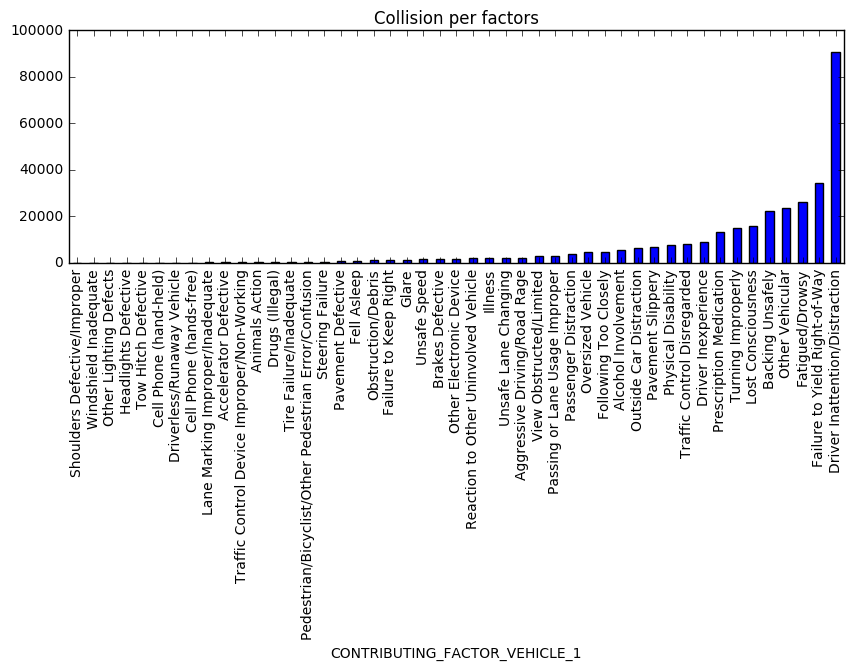

In [11]:
c_data_totals = c_data.groupby(['CONTRIBUTING_FACTOR_VEHICLE_1']).size()
c_data_totals = c_data_totals.drop('Unspecified')
c_data_totals = c_data_totals.sort_values()
c_data_totals.plot(kind='bar', title = 'Collision per factors', figsize=(10,3))
plt.show()

We see there are a lot of different factors leading to car crashes and collisions. From the chart we can see that the most frequent reason is driver inattention / distraction which is far above the rest.



#### Narrow the scope
For further analysis we have chosen to narrow it down to five factors to focus on. These five factors have been chosen as:

- Alcohol involvement
- Turning improperly
- Fatigued / drowsy
- Unsafe speed
- Traffic Control Disregarded



In [12]:
focus_factors = set(['Fatigued/Drowsy', 'Unsafe Speed',  'Turning Improperly', 'Traffic Control Disregarded', 'Alcohol Involvement'])

### Geodata
Next we will look a little further into the geodata and see where the accidents are occuring in the city

In [13]:
geo_data_all = {"lat": [float(x) for x in list(c_data['LATITUDE'])],
                             "lon": [float(x) for x in list(c_data['LONGITUDE'])]}

In [14]:
max_lat, min_lat = max(geo_data_all['lat']), min(geo_data_all['lat'])
max_lon, min_lon = max(geo_data_all['lon']), min(geo_data_all['lon'])

In [15]:
bbox = BoundingBox(north=max_lat, west=min_lon, south=min_lat, east=max_lon)

In [16]:
geoplotlib.kde(geo_data_all, bw = 2, cmap='jet')
geoplotlib.set_bbox(bbox)
geoplotlib.inline()

('smallest non-zero count', 4.4777898101688105e-09)
('max count:', 65.030801581337471)


It is quite clear that Manhattan is the place with most frequent crashes and collisions. This makes sense as it is the center of the city where the most cars are driving. We will try and zoom in on the center area of the city to better see the details of this area.

In [17]:
bbox_centrum = BoundingBox(north=40.78, west=-73.95, south=40.72, east=-73.93)
geoplotlib.kde(geo_data_all, bw = 2, cmap='jet')
geoplotlib.set_bbox(bbox_centrum)
geoplotlib.inline()

('smallest non-zero count', 2.2388949050844056e-08)
('max count:', 22.574178253402291)


It is quite clear that certain road and intersections in downtown are involved in many of the accidents..

To look a little further at the geodata we will try and plot only for our chosen focus factors and see if they all follow the same trend as the overall data. 

In [18]:
geo_data_focus = {}
geo_data_focus_borough = {}
for f in focus_factors:
    temp_geo_data = {"lat": [float(x) for x in list(c_data[c_data['CONTRIBUTING_FACTOR_VEHICLE_1']==f]['LATITUDE'])],
                             "lon": [float(x) for x in list(c_data[c_data['CONTRIBUTING_FACTOR_VEHICLE_1']==f]['LONGITUDE'])]}
    temp_geo_data_borough = {"lat": [float(x) for x in list(c_data[c_data['CONTRIBUTING_FACTOR_VEHICLE_1']==f]['LATITUDE'])],
                             "lon": [float(x) for x in list(c_data[c_data['CONTRIBUTING_FACTOR_VEHICLE_1']==f]['LONGITUDE'])],
                             "borough": [x for x in list(c_data[c_data['CONTRIBUTING_FACTOR_VEHICLE_1']==f]['BOROUGH'])]
                            }
    geo_data_focus[f] = temp_geo_data
    geo_data_focus_borough[f] = temp_geo_data_borough

In [19]:
#plot a map for each factor
for f in focus_factors:
    print f
    geoplotlib.kde(geo_data_focus[f], bw = 2, cmap='jet')
    geoplotlib.set_bbox(bbox)
    geoplotlib.inline()

Traffic Control Disregarded
('smallest non-zero count', 4.4777898101688105e-09)
('max count:', 0.84642522785296193)


Unsafe Speed
('smallest non-zero count', 4.4777898101688105e-09)
('max count:', 0.14964126957296442)


Alcohol Involvement
('smallest non-zero count', 4.4777898101688105e-09)
('max count:', 0.44442562613024833)


Turning Improperly
('smallest non-zero count', 4.4777898101688105e-09)
('max count:', 5.3457931481965257)


Fatigued/Drowsy
('smallest non-zero count', 4.4777898101688105e-09)
('max count:', 5.0817757966398114)


Looking at these plots we see some of the same tendencies as with the overall data but with some variations. Some factors are more centered around Manhattan such as turning improperly. Other factors are more decentralized such as unsafe speed which looks very equally distributed across the whole city. For alcohol involvement we see different hubs around the city where it occurs more frequently.

### Hourly distribution

Another aspect we can look into is the distribution of accidents across the day. Which hours are more unsafe to drive and which are the most safe? We can look at this again for the whole dataset but also for our individual factors.

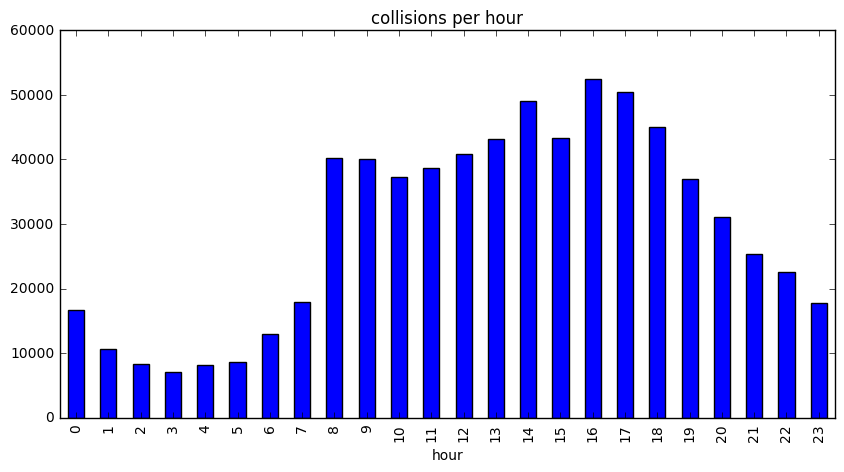

In [20]:
c_data['hour'] = c_data['TIME'].str.extract('([0-9]+)', expand=True)
hourly = c_data.groupby(['hour']).size()
hourly = hourly.reindex(index = ['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20','21','22','23'])
hourly.plot(kind='bar', title = 'collisions per hour',figsize=(10,5))
plt.show()

We can see that the most accidents happen in the middle of the day and primarily in the afternoon between 16 and 18. This makes sense because as this is the typical rush hour, where everyone is getting home from work. Likewise, it also correlates with the peak we see around 8 and 9 since this is the time people are driving to work. There is a remarkable difference between these two periods of time though as the amount of collisions during the earlier hours from 8-9 are lower than between 16-18. This might be because people are more focused in the morning whereas they might be more tired and stressed out on their way home. Generally, the number of collisions seems to be strongly correlated with the hours where there is more traffic.

Lets look at the same plot but for our focus factors to see if they show something similar

In [21]:
factors_hour = {}
for f in focus_factors:
    factors_hour[f]= c_data[c_data.CONTRIBUTING_FACTOR_VEHICLE_1 == f]
    factors_hour[f] = factors_hour[f].groupby(['hour']).size()
    #some issue with the indexes being mixed up so we manually sort it
    factors_hour[f] = factors_hour[f].reindex(index = ['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20','21','22','23'])

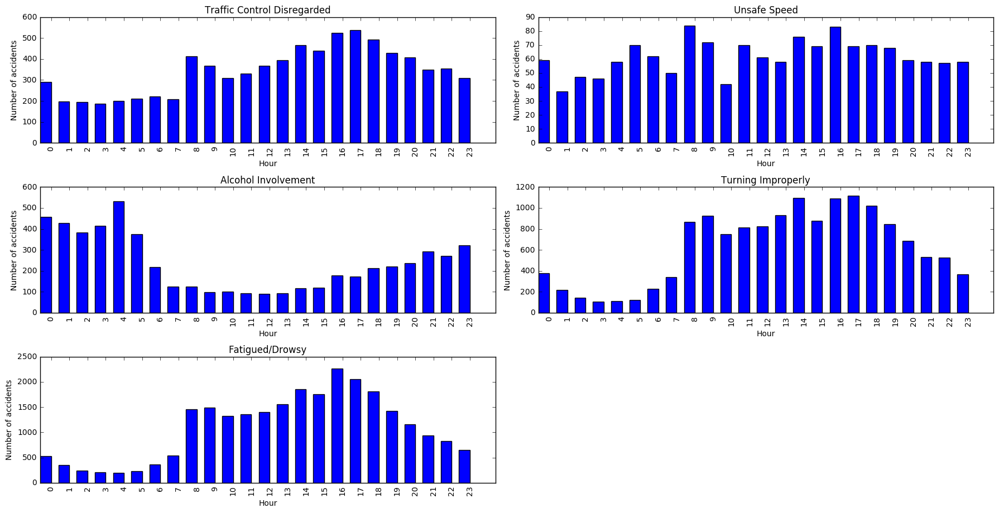

In [22]:
index = np.arange(len(factors_hour['Unsafe Speed']))
plt.figure(figsize=(18,18))
counter = 1
w = 0.6
for f in focus_factors:
    plt.subplot(6,2,counter)    
    plt.bar(index, factors_hour[f], w)
    plt.xticks(index + w,factors_hour[f].index, rotation='vertical')
    plt.title(f)
    plt.xlabel('Hour')
    plt.ylabel('Number of accidents')
    counter += 1
    plt.tight_layout(h_pad=1.0)
plt.show()

The impression we get from the focus factors match the overall impression pretty well. Especially traffic control disregarded, turning improperly and fatigued/drowsy, which all seem to follow the same pattern as for all the types of accidents. This could be because these three types are things that can occur at all times of the day and are therefore not directly correlated to the hour of the day but rather to how much traffic there is.

For alcohol involvement, though, we see a distribution that is almost opposite from the others; It starts to increase in the evening and peaks in the early morning, during the day there are very few alcohol involved accidents. This seems quite logical as people are more likely to be drinking alcohol in the night hours and then drive home early in the morning. During the day they are probably hungover and therefore not very likely to be driving.

Finally, an interesting pattern as well is the unsafe speed, which appears to occur more or less equally spread out throughout all hours of the day. The underlying reason why is hard to interpret only from looking at the data.

### Injuries

Another aspect to investigate is how many injuries the focus factors are responsible for. Perhaps certain type of accidents causes more injuries and should therefore be feared more. We will plot a chart for each of the factors and see the number of injured persons for them.

In [23]:
factors_injuries = c_data[c_data['CONTRIBUTING_FACTOR_VEHICLE_1'].isin(focus_factors)]
#remove injuries above 5 because they happen so rarely it wont be visible in a chart
factors_injuries = factors_injuries[(np.abs(stats.zscore(factors_injuries[['NUMBER_OF_PERSONS_INJURED']])) < 5 ).all(axis=1)]
factors_injuries = factors_injuries.groupby(['CONTRIBUTING_FACTOR_VEHICLE_1','NUMBER_OF_PERSONS_INJURED']).size()

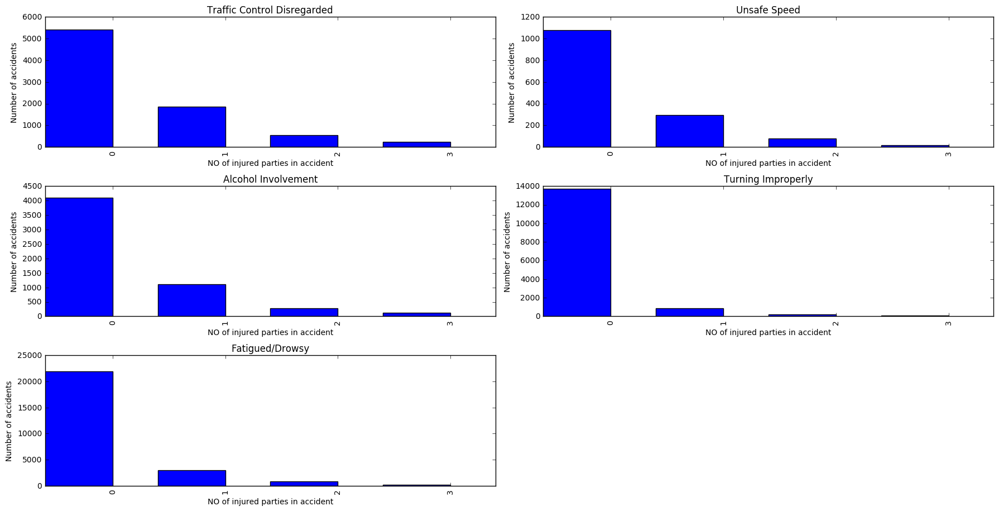

In [24]:
plt.figure(figsize=(18,18))
counter = 1
w = 0.6
for f in focus_factors:
    index = np.arange(len(factors_injuries[f]))
    plt.subplot(6,2,counter)    
    plt.bar(index, factors_injuries[f], w)
    plt.xticks(index + w,factors_injuries[f].index, rotation='vertical')
    plt.title(f)
    plt.xlabel('NO of injured parties in accident')
    plt.ylabel('Number of accidents')
    counter += 1
    plt.tight_layout(h_pad=1.0)
plt.show()

In [25]:
tot = factors_injuries['Traffic Control Disregarded'][0]+factors_injuries['Traffic Control Disregarded'][1]+factors_injuries['Traffic Control Disregarded'][2]+factors_injuries['Traffic Control Disregarded'][3]
tcd = factors_injuries['Traffic Control Disregarded'][1]+factors_injuries['Traffic Control Disregarded'][2]+factors_injuries['Traffic Control Disregarded'][3]
print 'total traffic control disregared accidents:', tot
print 'traffic control disregared accidents with injuries:', tcd
print 'percentage of traffic control disregared accidents with injuries:', tcd/tot*100

total traffic control disregared accidents: 8047
traffic control disregared accidents with injuries: 2644
percentage of traffic control disregared accidents with injuries: 32.8569653287


We see that for most of the factors there are zero injuries. However we still see a tendency to some of the factors being more dangerous. We can see that ‘turning improperly’ and ‘fatigued/drowsy’ are rather safe in the sense that hardly anyone get injured. However the remain factors have a certain degree of unsafety. If we take traffic control disregarded we see that over ⅓ of the time someone gets injured from these accidents.

# Theory

### K-means clustering

The first method chosen, for analysing the geo-data, is the k-means clustering. This algorithm divides the data into k clusters where each datapoint is assigned to a cluster with the nearest mean (centroids). By applying this to our geo-data we can potentially see areas in the city where accidents are centered. Before creating the clusters we must find the right number of clusters k. A way of selecting the right k is finding the elbow-point. 

#### Inertias and finding k

In [26]:
#function used to find the inertias
def findClusters(factor):
    max_lat, min_lat = max(geo_data_focus[factor]['lat']), min(geo_data_focus[factor]['lat'])
    max_lon, min_lon = max(geo_data_focus[factor]['lon']), min(geo_data_focus[factor]['lon'])
    k_points = np.array([geo_data_focus[factor]['lon'], geo_data_focus[factor]['lat']]).T
    k_clusters = range(2,20)
    k_inertias = []
    for k in k_clusters:
        kmeans = cluster.KMeans(n_clusters=k)
        kmeans.fit(k_points)
        temp_in = kmeans.inertia_
        k_inertias.append(temp_in)
    fig = plt.figure(figsize=(8,5))
    i_plot = fig.add_subplot(111)
    i_plot.plot(list(k_clusters), k_inertias, marker='o')
    i_plot.set_title('Inertias for ' + factor)
    i_plot.set_xlabel('NO of clusters')
    i_plot.set_ylabel('Squared error')
    plt.show()
    t_k = 2
    for k in k_inertias:
        print 'k'+ str(t_k), str(k)
        t_k+=1

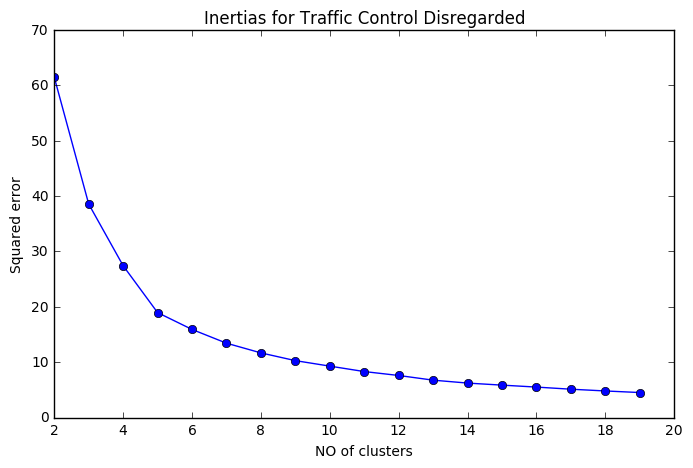

k2 61.4764556984
k3 38.5657106104
k4 27.4199973495
k5 18.9510575069
k6 15.9082073197
k7 13.4254897849
k8 11.670093809
k9 10.2722271306
k10 9.28058425881
k11 8.29887670894
k12 7.58994447915
k13 6.74557461753
k14 6.21644210806
k15 5.84726186091
k16 5.49436631456
k17 5.11133676031
k18 4.79387624267
k19 4.50723416268


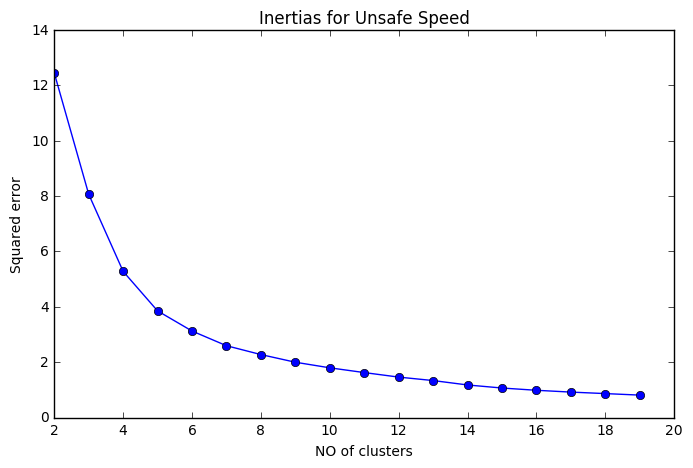

k2 12.4482372744
k3 8.06705536257
k4 5.27887576685
k5 3.85091843091
k6 3.1242767484
k7 2.59343597376
k8 2.27355538655
k9 1.99673324612
k10 1.79502915907
k11 1.62306735446
k12 1.45959146863
k13 1.3346563547
k14 1.17510664633
k15 1.06484484728
k16 0.983106956217
k17 0.917759546076
k18 0.863740092602
k19 0.808839971828


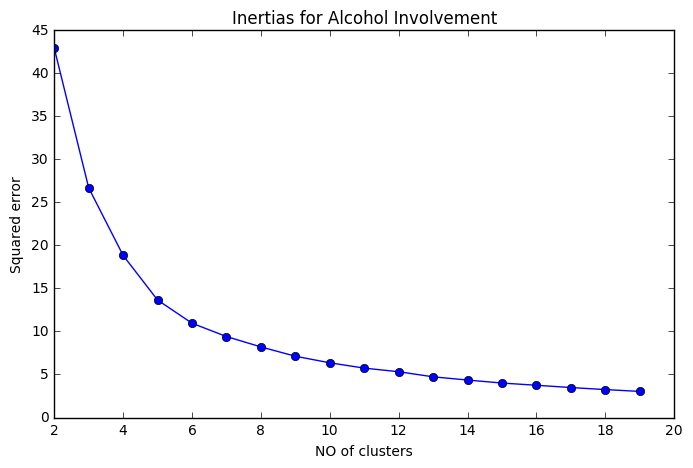

k2 42.8908368923
k3 26.6679593472
k4 18.8219398931
k5 13.6404497625
k6 10.9473143652
k7 9.40054809867
k8 8.19659570981
k9 7.11332567884
k10 6.35283323806
k11 5.73374412943
k12 5.31467846004
k13 4.72345575912
k14 4.34942300567
k15 3.99961512681
k16 3.74379226648
k17 3.47844525535
k18 3.24251732458
k19 3.02855688968


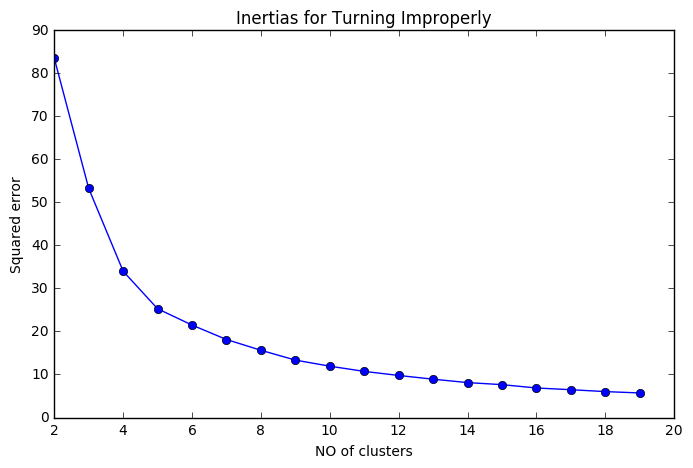

k2 83.4682298957
k3 53.2132362315
k4 33.9751258611
k5 25.2547874366
k6 21.4685945194
k7 18.1130231707
k8 15.6149821097
k9 13.3313078079
k10 11.9193992059
k11 10.7094011033
k12 9.76374831844
k13 8.8954336055
k14 8.10743586926
k15 7.63083675404
k16 6.85223915719
k17 6.45500230525
k18 6.01478437199
k19 5.70297956932


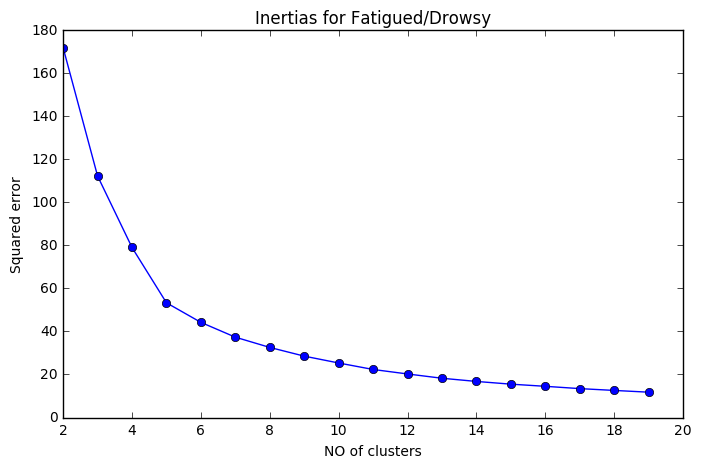

k2 171.771703181
k3 112.18443771
k4 78.9751565316
k5 53.2746005045
k6 44.1879769609
k7 37.3119634758
k8 32.5495738422
k9 28.5045956454
k10 25.3182126719
k11 22.3067432035
k12 20.2208015295
k13 18.2288196329
k14 16.7508919974
k15 15.4882450692
k16 14.48656166
k17 13.4173618264
k18 12.5744950594
k19 11.7588065936


In [27]:
#run the function for each of our focus factors
for f in focus_factors:
    findClusters(f)

Now choose the right number of k for creating the clusters. As there is no clear elbow point in any of our plots it is quite difficult to pick the right k. It is possible to perform other calculations to find k, e.g. stability analysis. However for this visulization (which is explained below) we want make sure we dont have to few clusters, so more is better than to few. We will therefore pick a rather high k before the error starts to even out.

#### Creating the clusters and finding average distance between points in each cluster

Now we create the clusters from the k values we found. For our visualization we are mainly interested in the centroids as they can serve as indicators for areas. However as clusters can vary greatly in size and density this should somehow also be represented in the visualization. We will therefore for each cluster centroid found also save how many points are in the cluster. Furthermore we will for each cluster calculate the average distance between the points in the cluster. Herby we can find if it is a small centralized area of accidents or a more spread out area. This data will be saved to csv files and used to visualize on the website. In this notebook we will simply take a look at the clusters to see if they make sense.

In [28]:
def getClusters(factor, k):
    my_size = 0
    x_list = []
    y_list = []
    k_list = []
    centroid_x_list = []
    centroid_y_list = []
    centroid_size = []
    k_points = np.array([geo_data_focus_borough[factor]['lon'], geo_data_focus_borough[factor]['lat']]).T
    kmeans = cluster.KMeans(n_clusters=k)
    kmeans.fit(k_points)
    labels = kmeans.labels_
    centroids = kmeans.cluster_centers_
    fig = plt.figure(figsize = (8,8))
    c_plot = fig.add_subplot(111)
    for i in range(k):
        temp_points = k_points[np.where(labels==i)]
        centroid_size.append(len(temp_points))
        my_size+=(len(temp_points))
        c_plot.plot(temp_points[:,0],temp_points[:,1],'o')
        for x in range(len(temp_points)):
            #add lon and lat plus the cluster number to a list
            x_list.append(temp_points[x,0])
            y_list.append(temp_points[x,1])
            k_list.append(i)
        lines = c_plot.plot(centroids[i,0],centroids[i,1],'kx', markersize=20, mew=2.5)
        centroid_x_list.append(centroids[i,0])
        centroid_y_list.append(centroids[i,1])
    c_plot.set_title(factor,)
    c_plot.set_xlabel("Longitude", fontsize = 12)
    c_plot.set_ylabel("Latitude", fontsize = 12)   
    plt.show()
    #now we translate this over to pandas frames
    temp_point_frame = pandas.DataFrame({'A' : []})
    temp_centroids_frame = pandas.DataFrame({'A' : []})
    xframe = pandas.Series(x_list)
    yframe = pandas.Series(y_list)
    kframe = pandas.Series(k_list)
    temp_point_frame['x'] = xframe.values
    temp_point_frame['y'] = yframe.values
    temp_point_frame['k'] = kframe.values
    temp_point_frame = temp_point_frame.drop('A', 1)
    fdp = {}
    #now we calculate the average distance between points
    averages_list = []
    for f in range(max(temp_point_frame.k)+1):
        fdp[f]= temp_point_frame[temp_point_frame.k == f] 
    for f in range(len(fdp)):
        fdp[f] = fdp[f][['x','y']]
    for f in range(len(fdp)):
        fdp[f] = fdp[f].values
    for f in range(len(fdp)):
        tot = 0
        #add the distance between points to a total and divide between total number of points
        for i in xrange(fdp[f].shape[0]-1):
            tot += ((((fdp[f][i+1:]-fdp[f][i])**2).sum(1))**.5).sum()
        avg = tot/((fdp[f].shape[0]-1)*(fdp[f].shape[0])/2.)
        averages_list.append(avg)
    #translating the data found over to the pandas dataframe
    c_x_frame = pandas.Series(centroid_x_list)
    c_y_frame = pandas.Series(centroid_y_list)
    c_size_frame = pandas.Series(centroid_size)
    avg_distance_frame = pandas.Series(averages_list)
    temp_centroids_frame['x'] = c_x_frame.values
    temp_centroids_frame['y'] = c_y_frame.values
    temp_centroids_frame['size'] = c_size_frame.values
    temp_centroids_frame['average_distance'] = avg_distance_frame.values
    temp_centroids_frame = temp_centroids_frame.drop('A', 1)
    return temp_point_frame, temp_centroids_frame

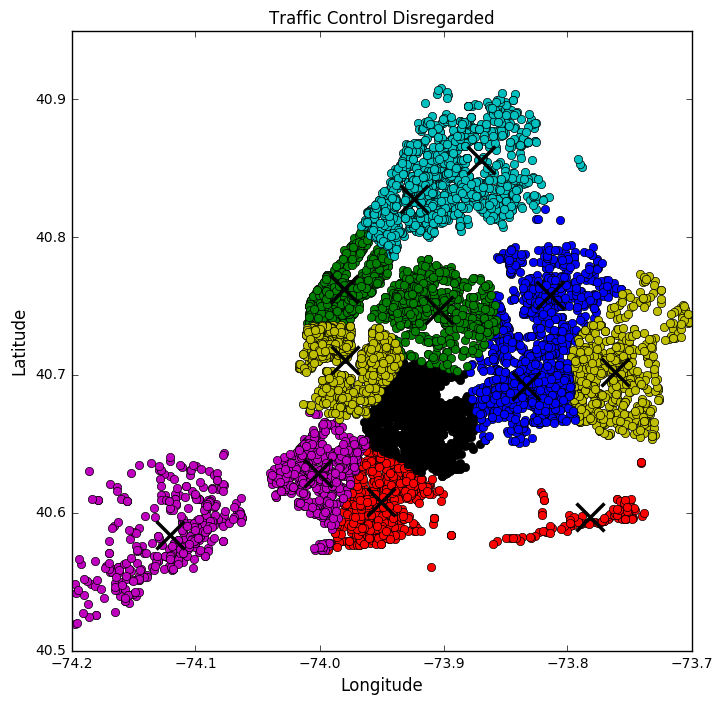

In [29]:
#plot clusters for each of our factors
traffic_control_disregarded_points,traffic_control_disregarded_centroids = getClusters('Traffic Control Disregarded',13)

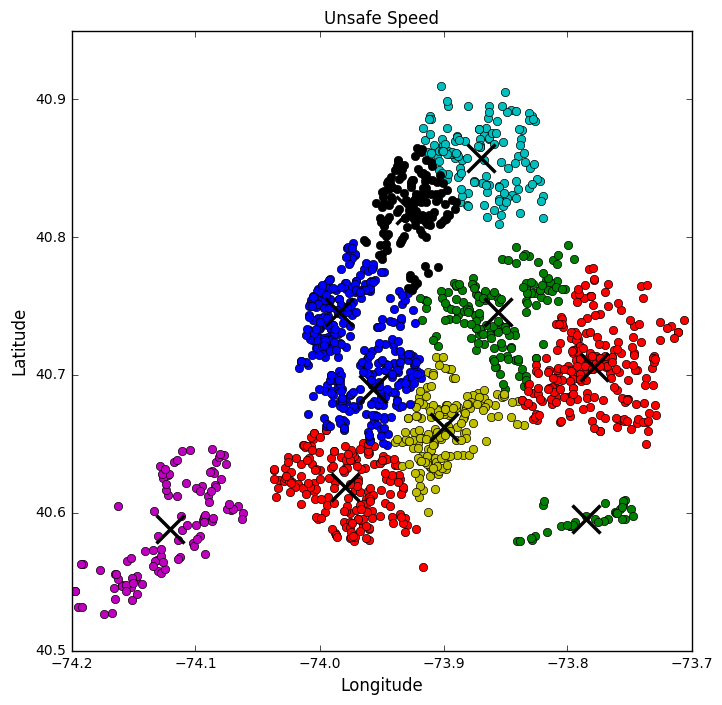

In [30]:
unsafe_speed_points,unsafe_speed_centroids = getClusters('Unsafe Speed',10)

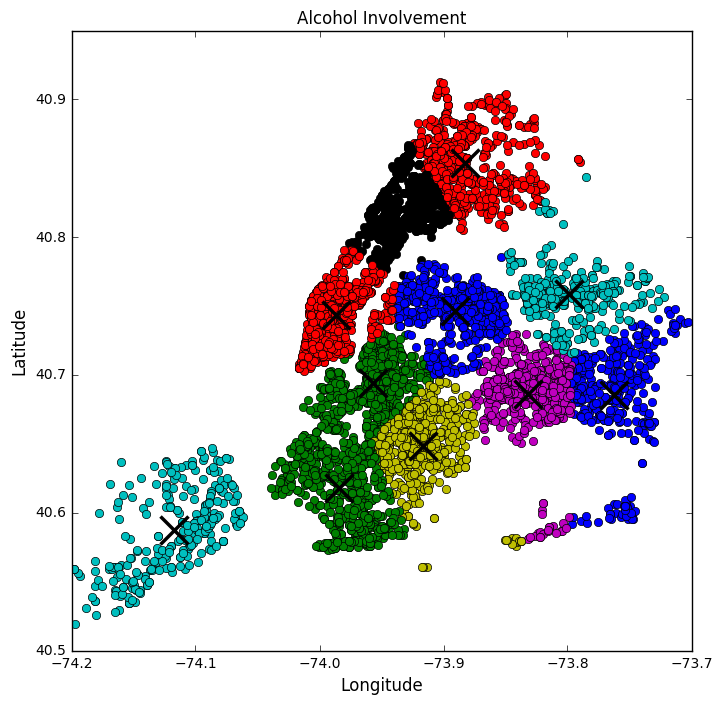

In [31]:
alcohol_involvement_points,alcohol_involvement_centroids = getClusters('Alcohol Involvement',11)

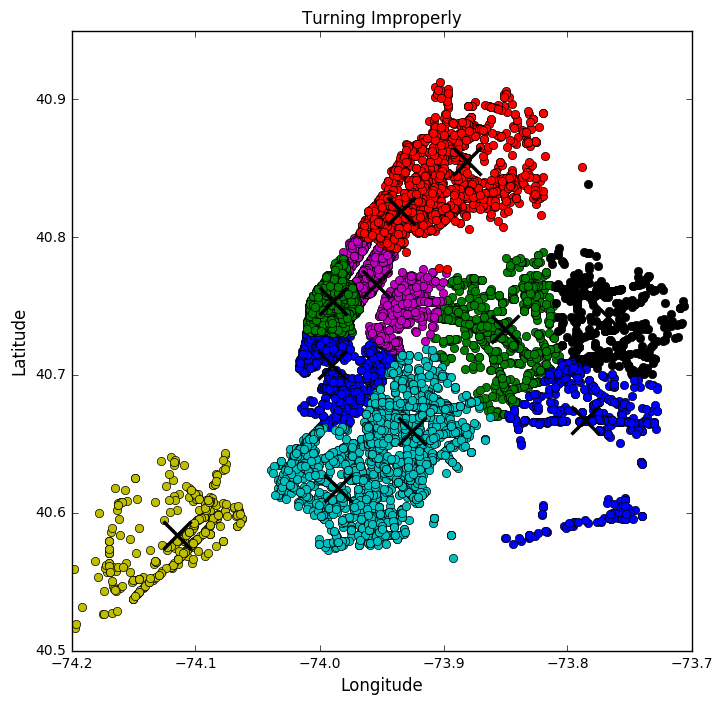

In [32]:
turning_improperly_points,turning_improperly_centroids = getClusters('Turning Improperly',11)

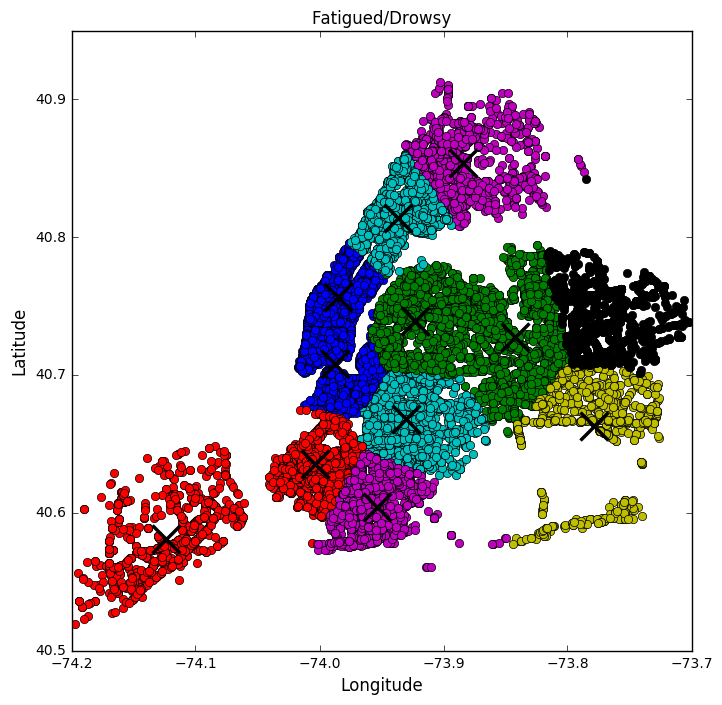

In [33]:
fatigued_drowsy_points,fatigued_drowsy_centroids = getClusters('Fatigued/Drowsy',12)

### Regression

In this section we will focus on the total number of accidents that happen within each hour of the day. In order to visualize the general trend for each of the five types of accidents we perform a simple linear regression. This can give an impression of whether the number of accidents increase or decrease from 0 to 23. Afterwards we expand the linear regression adding another variable, which is the total amount of accidents counting all accidents in each time slot regardless of the type of accident. Doing this we can perform a multiple linear regression, which should give a better fitting model. The variables for the multiple linear regression are both calculated with regards to the average amount of accidents throughout the year and rescaled afterwards.
These linear regression models can then be used to predict at which hours of the day a specific type of accident is more likely to happen.

In [35]:
data = c_data
data['TIME'] = pandas.to_datetime(data['TIME'], format='%H:%M').dt.hour

#### Linear regression

In [36]:
def linreg(x,y):
    "simple linear regression"
    reg1 = linear_model.LinearRegression()
    reg1.fit(x,y)
    a = reg1.coef_[0][0]
    b = reg1.intercept_[0]
    return reg1.predict(x)

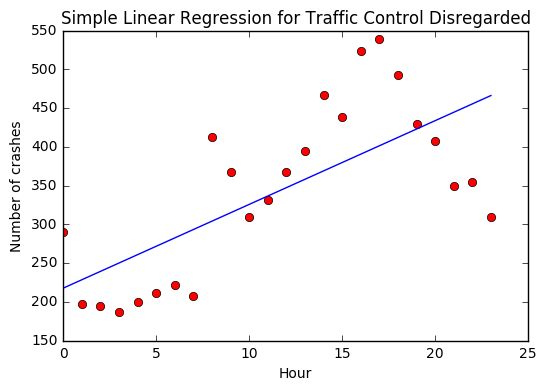

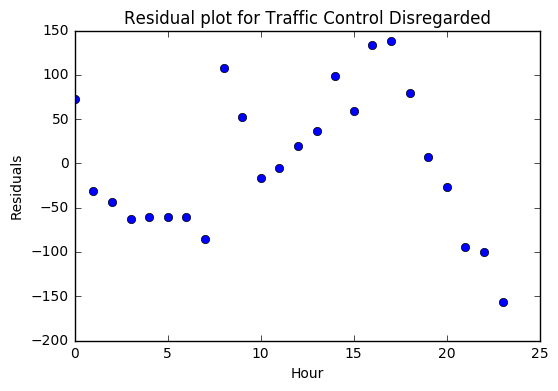

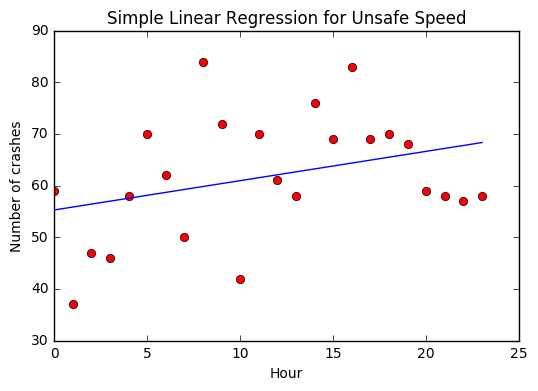

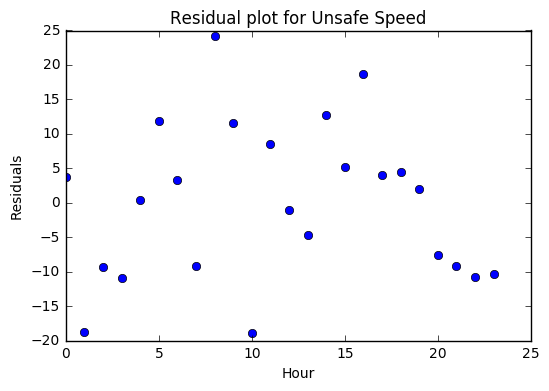

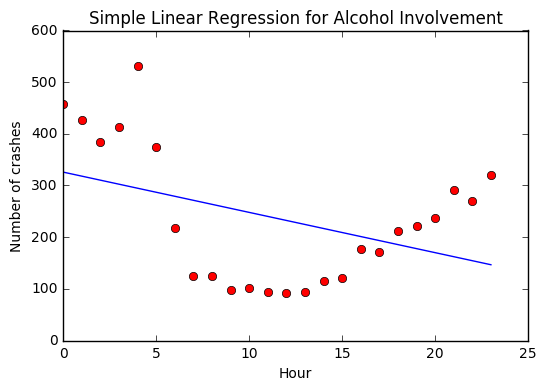

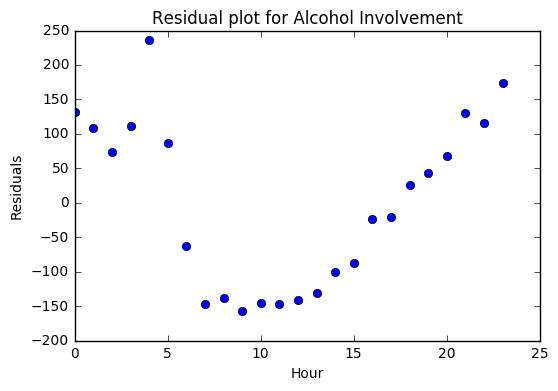

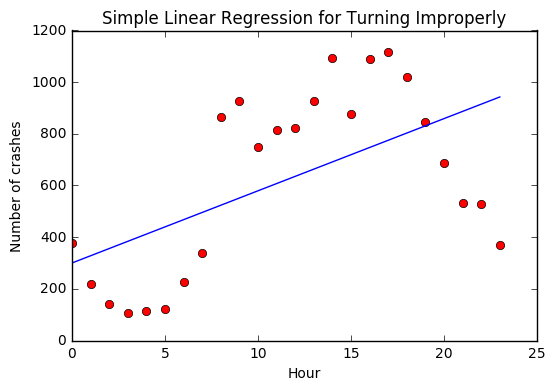

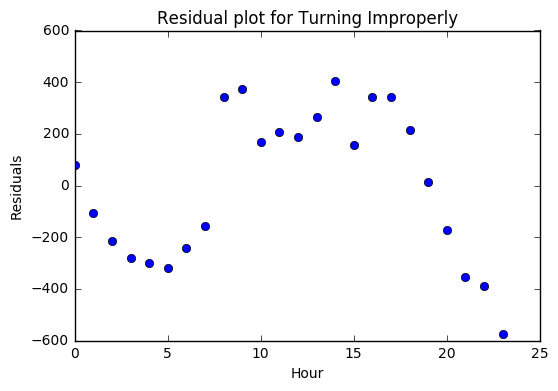

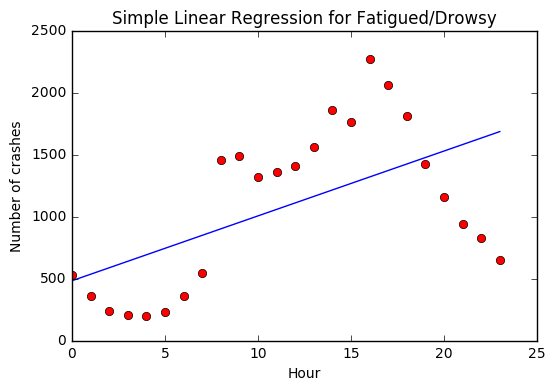

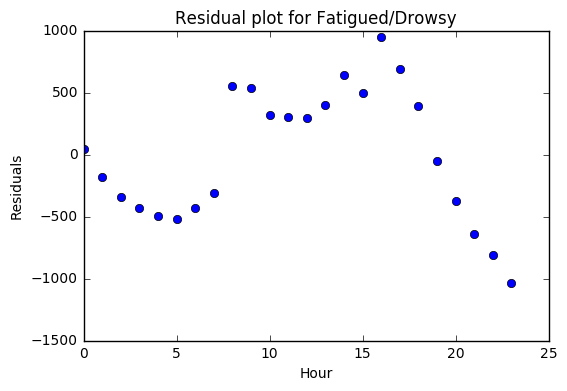

In [38]:
# Plot
for i in focus_factors:
    Data = data[(data['CONTRIBUTING_FACTOR_VEHICLE_1'] == i)]
    # total number of crashes
    count = []
    for j in Data.groupby(['TIME', 'CONTRIBUTING_FACTOR_VEHICLE_1']).size():
        count.append(j)
    x = zip(range(0,24))
    y = zip(count)
    plt.figure(1)
    plt.plot(x, y, 'ro')
    plt.xlabel('Hour')
    plt.ylabel('Number of crashes')
    plt.title('Simple Linear Regression for ' + i)
    plt.plot(x, linreg(x,y))
    if i != 'Fatigued/Drowsy':
        plt.savefig('lin'+i+'.png', dpi = 300)
    else:
        plt.savefig('linDrowsy.png', dpi = 300)
    plt.show()
    plt.figure(2)
    plt.plot(x,y-linreg(x,y),'o')
    plt.xlabel('Hour')
    plt.ylabel('Residuals')
    plt.title('Residual plot for ' + i)
    plt.show()

Looking at the simple linear regression models for the five types of accidents it appears that only two of them seem to fit the data somewhat properly. For the unsafe speed and traffic control disregarded there is an increase in the number of accidents throughout the day. For the other three types; alcohol involvement, fatigued/drowsy and turning improperly there seems to be pattern, which is not very linear at all. Therefore the model does not work as well for these types. A good way to visualize whether the model is fitting the data well is by looking at the residuals. If the model fits the data perfectly, the residuals should all just be random white noise around 0 and not show any pattern as they do for these three types of accidents. Only the residuals for unsafe speed appears to be a bit more random than the other types, but this might also be due to the fact that the data in general is more spread out for this specific type of accident. 

#### Multiple regression

In [39]:
def mulreg(x,y):
    "multiple linear regression"
    reg2 = linear_model.LinearRegression(fit_intercept=True)
    reg2.fit(x,y)
    b1 = reg2.coef_[0]
    b2 = reg2.coef_[1]
    a = reg2.intercept_
    ab = np.stack(([min(x1),max(x1)],[min(x2),max(x2)]),axis=1)
    c = reg2.predict(ab).T
    return reg2.predict(x), c

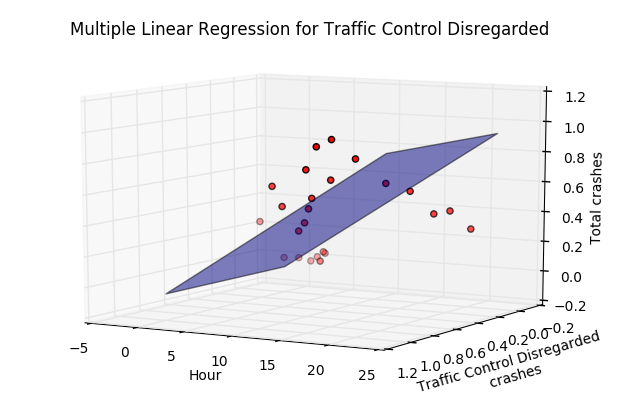

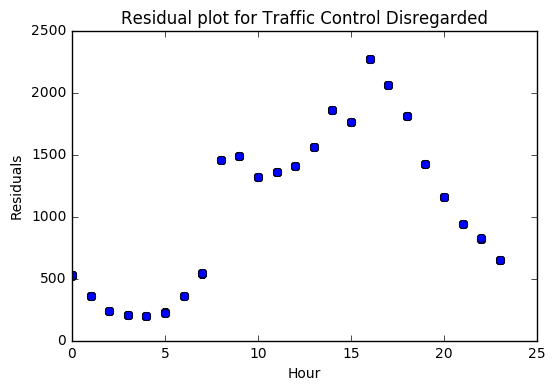

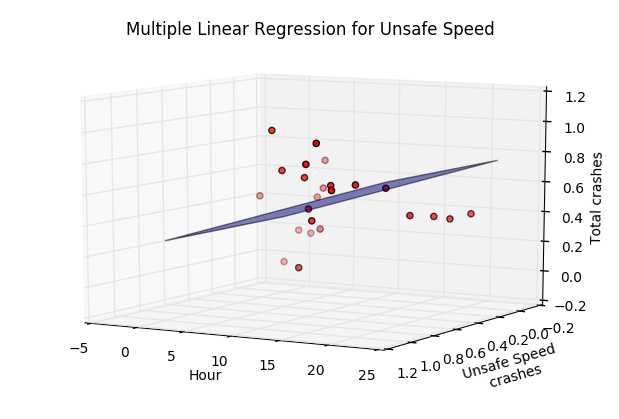

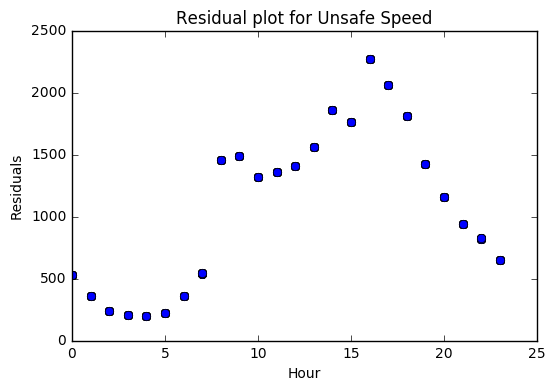

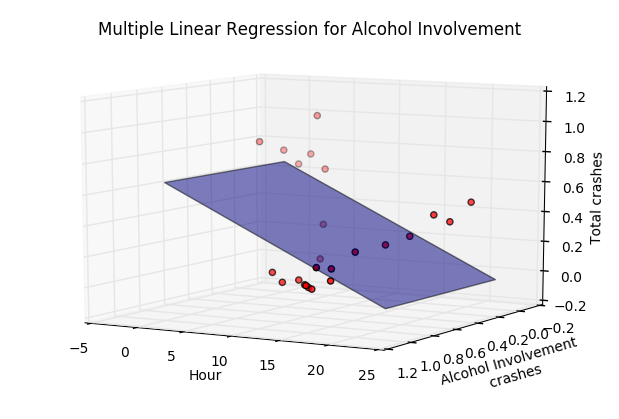

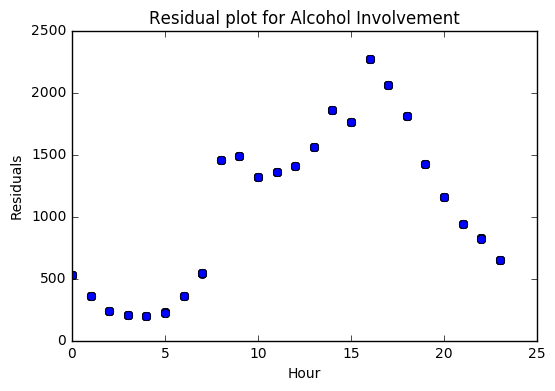

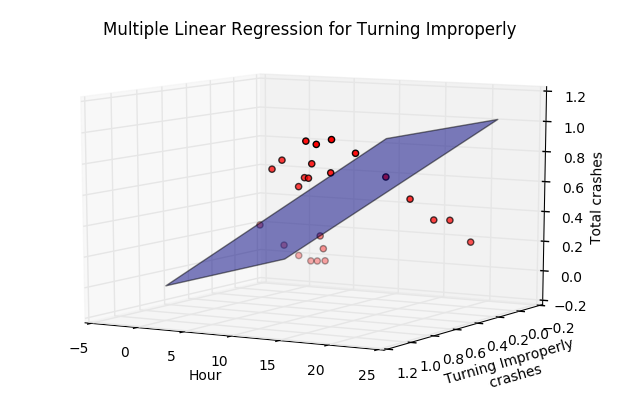

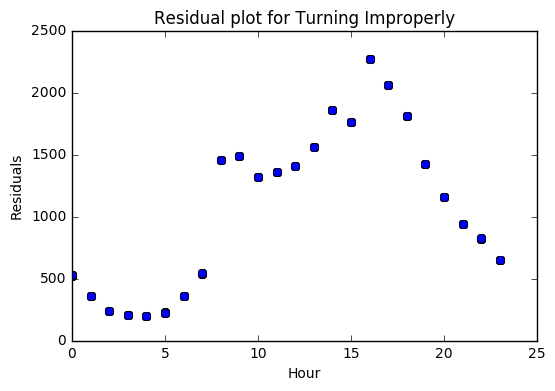

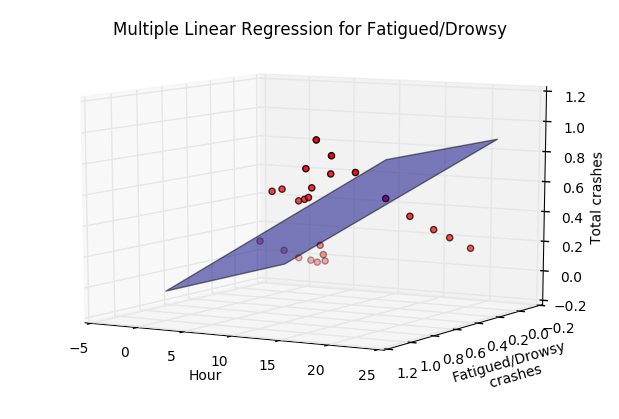

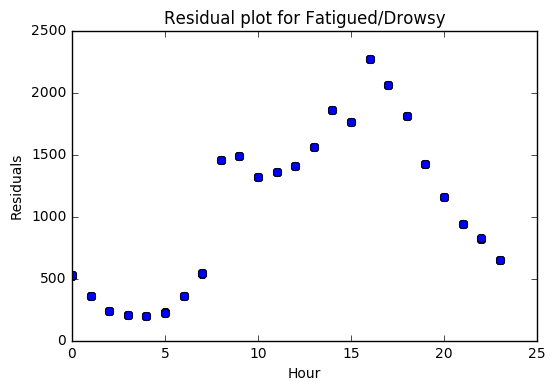

In [40]:
# total number of crashes
totalcount = []
for i in data.groupby(['TIME']).size():
    totalcount.append(i)
        
for j in focus_factors:
    Data = data[(data['CONTRIBUTING_FACTOR_VEHICLE_1'] == j)]
    # total number of crashes
    count = []
    for k in Data.groupby(['TIME', 'CONTRIBUTING_FACTOR_VEHICLE_1']).size():
        count.append(k)

    days = 3*30+3*31+4*365+1+31+30+31+24
    avg1 = []
    x2wrtavg = []
    avg1 = [1/days * totalcount[i] for i in range(24)]
    x2wrtavg = [totalcount[i] - avg1[i] for i in range(24)]

    avg2 = []
    ywrtavg = []
    avg2 = [1/days * count[i] for i in range(24)]
    ywrtavg = [count[i] - avg2[i] for i in range(24)]

    # rescaling

    x2 = [(m - min(x2wrtavg))/(max(x2wrtavg)-min(x2wrtavg)) for m in x2wrtavg]
    yscaled = [(n - min(ywrtavg))/(max(ywrtavg)-min(ywrtavg)) for n in ywrtavg] 
    x1 = range(24)
    X = zip(x1,x2)
    Y = yscaled
      
    #prepare data for plot

    C,c = mulreg(X,Y)
    a,b = np.meshgrid([min(x1),max(x1)],[min(x2),max(x2)])
    
    
    #create plot
    fig = plt.figure(3)
    ax = Axes3D(fig)
    ax.scatter(x1,x2,Y, c='r', marker='o')
    ax.set_xlabel('Hour',fontsize = 10)
    ax.set_ylabel('\n' + str(j) + '\n crashes',fontsize = 10)
    ax.set_zlabel('Total crashes \n',fontsize = 10)
    ax.set_title('Multiple Linear Regression for ' + str(j))
    ax.plot_surface(a,b,c,color='b',alpha=0.5)
    ax.invert_xaxis()
    ax.view_init(10,120)
    if j != 'Fatigued/Drowsy':
        plt.savefig('mul'+str(j)+'.png', dpi = 300)
    else:
        plt.savefig('mulDrowsy.png', dpi = 300)
    plt.show()
    plt.figure(4)
    plt.plot(x1,y-C,'bo')
    plt.xlabel('Hour')
    plt.ylabel('Residuals')
    plt.title('Residual plot for ' + j)
    plt.show()

Performing a multiple linear regression, where we add another variable, we get a much better fit to the data as expected. The total number of accidents of one specific type still does not look linear, but adding an extra dimension increases the accuracy of the prediction. Looking at the residuals there is now no clear pattern for any of the five models. They are all very far from 0, though, which indicates that this model fits all the data points equally bad instead of fitting some of the points very well and others very poorly. Therefore this model is prefered as it is better at showing the general tendency.

# Visualizations

### Map

To show the data we have chosen to use a map as one of the main visualizations. The map then shows the data for our 5 focus factors in a few different ways. The first map gives an indication to how spread out the different factors are but also shows the user how many injuries each factor is causing. It is clear to see that they differ in how they spread out across New York and also how dangerous they are. The second map is based on K-means and is meant for the user to see significant areas where the given factor is occuring. By interpreting the circles he is also able to see how much aware he should be at the given area. A small, low opacity circle indicates an area with many of the accidents occuring close to the circle. He should therefore be alert when driving in this area. This can e.g. be seen for fatigued/drowsiness which is centralized around mid-Manhattan, lower Manhattan and the part of Brooklyn leading up to Manhattan. Alternativly we can see rather safe areas for other factors. E.g. speeding is only a slight problem on Staten Island and only on the north side. It should be noted here that the factors are relative to themselves, so each factor weight as much as the other ones even though certain accidents such as 'turning improperly' is much more frequent.

### Regressions

The simple linear regression is visualised using a scatterplot, where the red dots each represent the total amount of crashes of one of the five types of accidents at each hour of the day. The blue line is the linear regression, from which the predicted amount of accidents for each time of the day can be found.

As the multiple linear regression has several explanatory variables, the best way to visualize it is by using a 3D plot, where the multiple linear regression is represented by a surface and the red dots are still the total amount of crashes of one specific type. From the plane the predicted number of accidents of one of the five types can be found for each hour of the day depending on total amount of accidents overall.

# Discussion

For the k-means clustering a few issues were identified. The first issue is that perhaps this was not a good algorithm to use for visualizing the data. K-means is perhaps most useful if you are sure their are groupings and if there is not it might not give you something useful. An indication of this could be the fact that a clear k was not to be found. Furthermore it would have been beneficial to perform another calculation for finding the right k.

For the map visualization we made each factor count equally. This can give the wrong impression to users but if this had not been done some factors would hardly be visible. This is of course a tradeoff you sometimes need to make. Furthermore the visualization with clusters had the sizes based on average distance and opacity by number of accidents. Perhaps people could find it confusing that larger size means more spread out data, and hereby less dangerous area.


After having performed the linear regression several weaknesses have come to mind. First of all the linear regression have been made for the hours starting at midnight until 23 the next night. This results in most of the models starting at one interception at 0 and then ends quite a lot higher or lower at 23. This is a natural consequence of performing linear regression, but as the 24 hours of the day are not linear but circular this creates an issues in interpreting the data in the midnight hours. This issues could be overcome by for example performing a time series analysis.

Another point is that the data generally does not look linear and therefore the linear regression models are not suited for predicting accidents. Instead it would be very interesting to try and fit a taylor polynomial to the data such that it takes more of the pattern from the data into account. For future work this would be a great starting point in order to get better fitting models of the data while looking at the hours of the day.

# Appendix

This code has been used to create the datasets used in d3

In [ ]:
#function to create csv file with long/lat and number of injured for a specified factor
def createCSV_xy_injured(factor):
    csv_data = c_data[c_data['CONTRIBUTING_FACTOR_VEHICLE_1']==factor]
    csv_data = csv_data.ix[0:,['LONGITUDE','LATITUDE', 'NUMBER_OF_PERSONS_INJURED']]
    csv_data = csv_data[np.isfinite(c_data['LATITUDE'])]
    csv_data = csv_data[np.isfinite(c_data['NUMBER_OF_PERSONS_INJURED'])]
    #only take a sample of the data
    csv_data = csv_data.sample(n=2000)
    #change column name to be easily used in javascript
    #csv_data = csv_data.rename(columns={ 'NUMBEROF PERSONS INJURED' : 'INJURED'})
    return csv_data

In [ ]:
# create a csv file with data about location and injuries for each of the focus factors
for f in focus_factors:
    if(f != 'Fatigued/Drowsy'):
        createCSV_xy_injured(f).to_csv('xy_injured_'+f+'.csv', encoding='utf-8')
createCSV_xy_injured('Fatigued/Drowsy').to_csv('xy_injured_Fatigued_Drowsy.csv', encoding='utf-8')

In [ ]:
#for the centroid data 
turning_improperly_centroids.to_csv('TI_centroids.csv', encoding='utf-8')
unsafe_speed_centroids.to_csv('US_centroids.csv', encoding='utf-8')
alcohol_involvement_centroids.to_csv('AI_centroids.csv', encoding='utf-8')
traffic_control_disregarded_centroids.to_csv('TCD_centroids.csv', encoding='utf-8')
fatigued_drowsy_centroids.to_csv('FD_centroids.csv', encoding='utf-8')